In [55]:
import pandas as pd
import numpy as np
import time,os,sys,itertools
from collections import *
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

In [56]:
os.listdir()

['.git',
 '.gitignore',
 '.ipynb_checkpoints',
 'data',
 'isolet1+2+3+4.data',
 'isolet5.data',
 'playground.ipynb',
 'README.md',
 'shiftdataset.ipynb',
 'sk-tsne.ipynb',
 'trimap.py',
 'visualize-isolet.ipynb',
 'visualize-mnist.ipynb',
 '__pycache__']

In [57]:
data = pd.read_csv('isolet5.data',header = None)

In [58]:
data.shape

(1559, 618)

In [59]:
x,y = data.iloc[:,:-1], data.iloc[:,-1] # getting labels and features
X = np.asarray(x)
Y = np.asarray(y)
del x,y,data

In [60]:
print(X.shape,Y.shape)#,x.shape,y.shape)


(1559, 617) (1559,)


In [61]:
Y.shape

(1559,)

In [62]:
X_embedded = TSNE(n_components=2).fit_transform(X)

In [63]:
y,x = Y,X

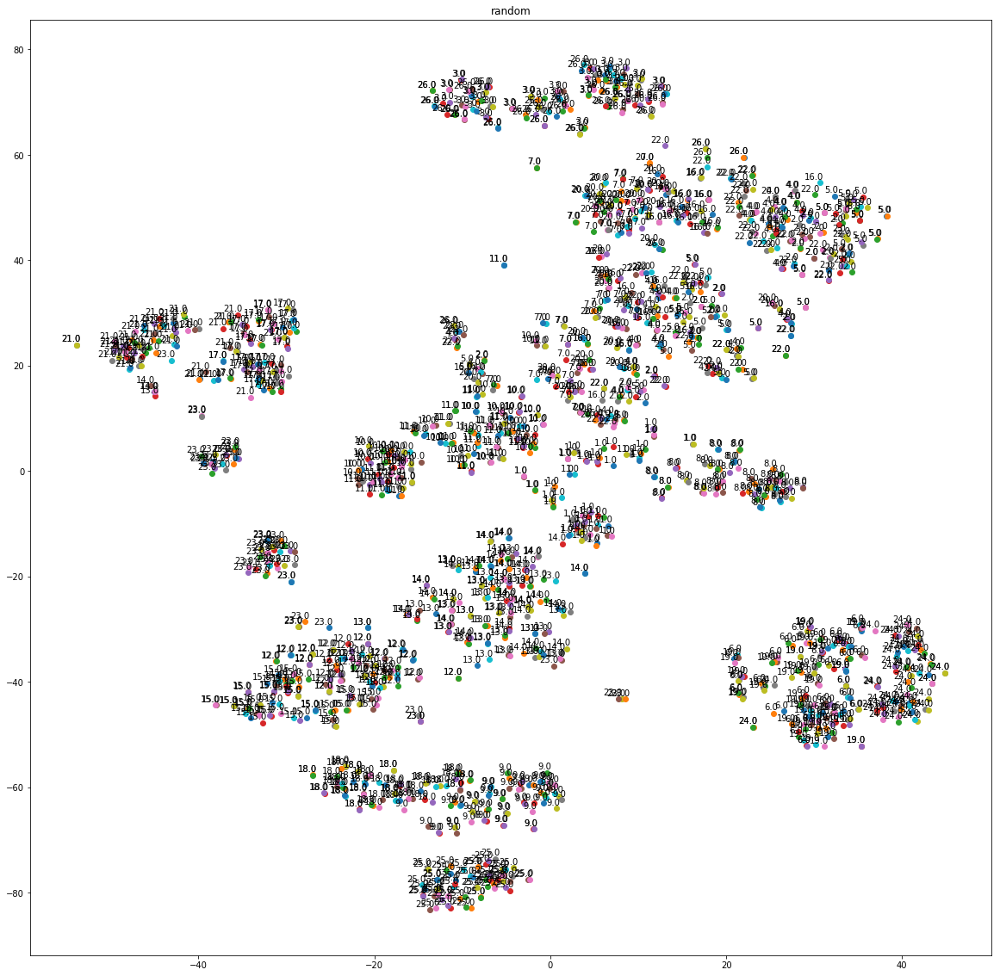

In [64]:
# Function to draw visualization of distance between embeddings.
def plot_with_labels(low_dim_embs, labels, title = "random"):
	assert low_dim_embs.shape[0] >= len(labels), 'More labels than embeddings'
	plt.figure(figsize=(20,20))  # in inches
	plt.title(str(title))#"perplexity = {0}, n_iterations = {1}".format(perplexity,n_iters))

	for i, label in enumerate(labels):
		x, y = low_dim_embs[i, :]
		plt.scatter(x, y)
		plt.annotate(label,
								 xy=(x, y),
								 xytext=(5, 2),
								 textcoords='offset points',
								 ha='right',
								 va='bottom')
	#plt.title("tsne direct "+str(title))
	#plt.scatter(low_dim_embs[:,0],low_dim_embs[:,1],26,labels)

plot_with_labels(X_embedded,Y)

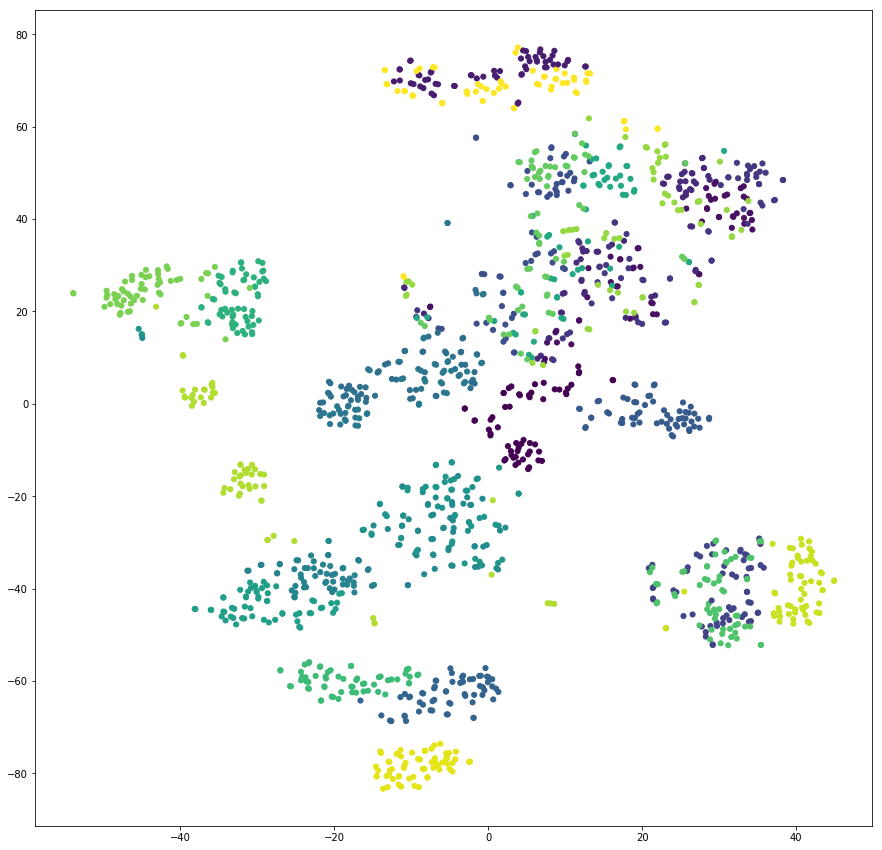

In [65]:
plt.figure(figsize = (15,15))
plt.scatter(X_embedded[:,0],X_embedded[:,1],26,Y)

/home/sanjay/.local/lib/python3.5/site-packages/matplotlib/pyplot.py:523: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


Time taken:1088.3097605705261


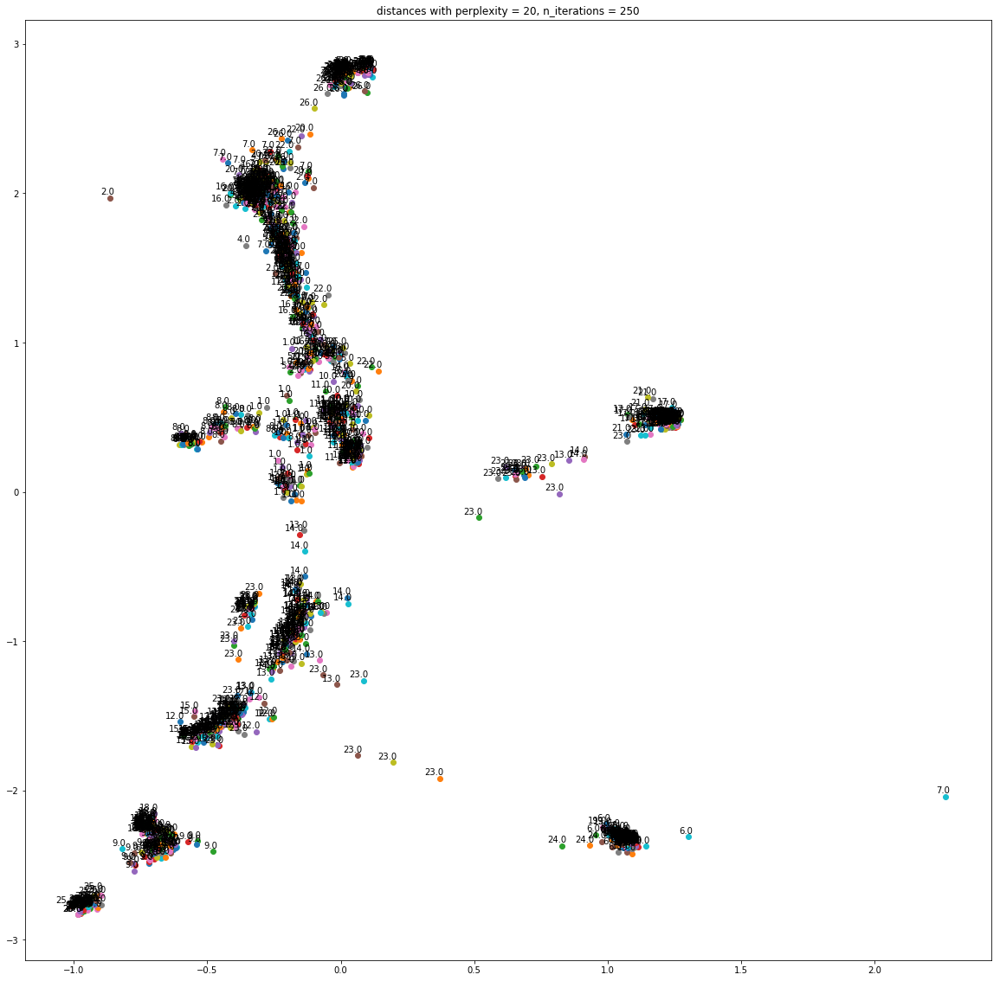

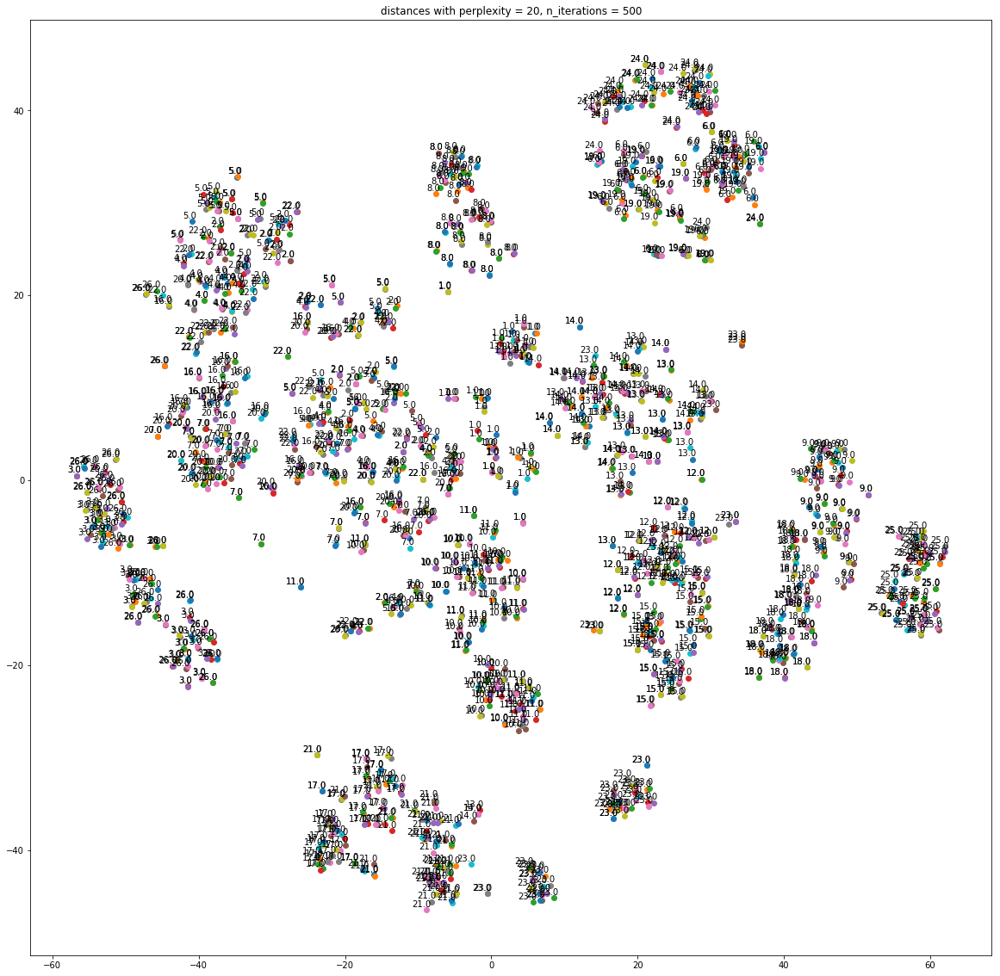

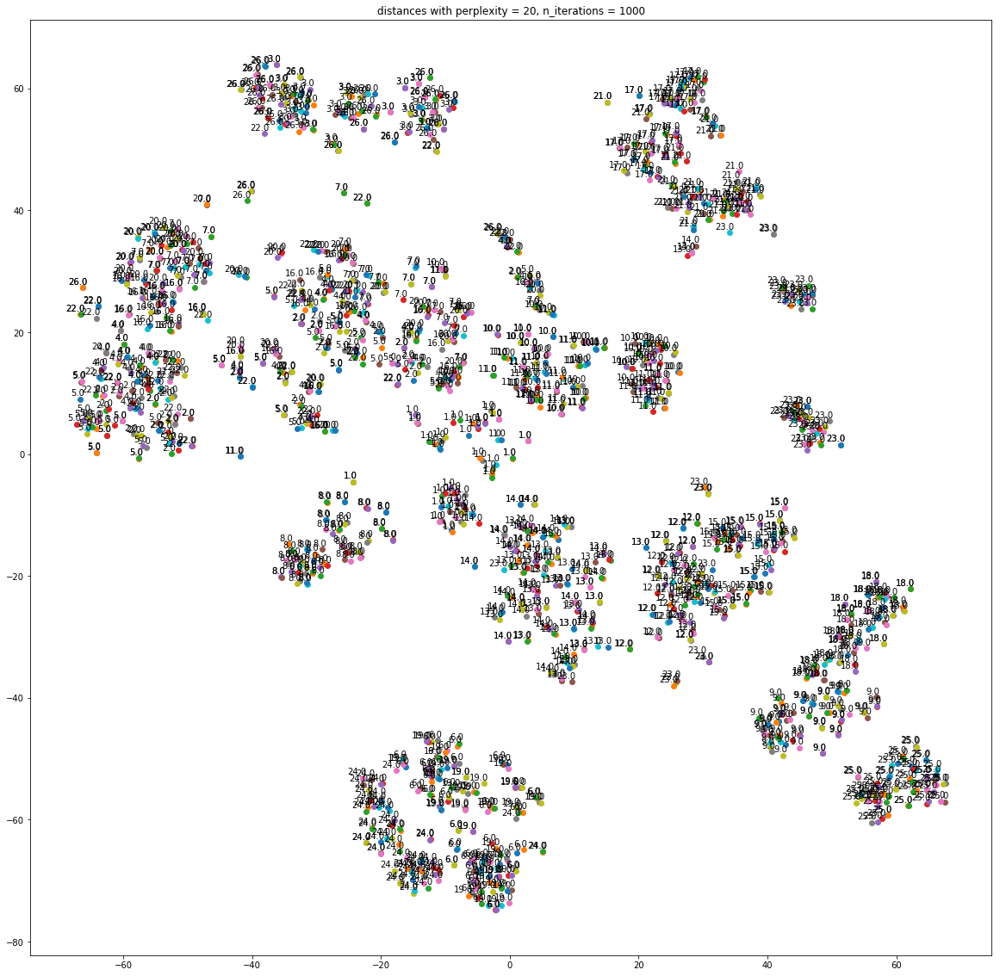

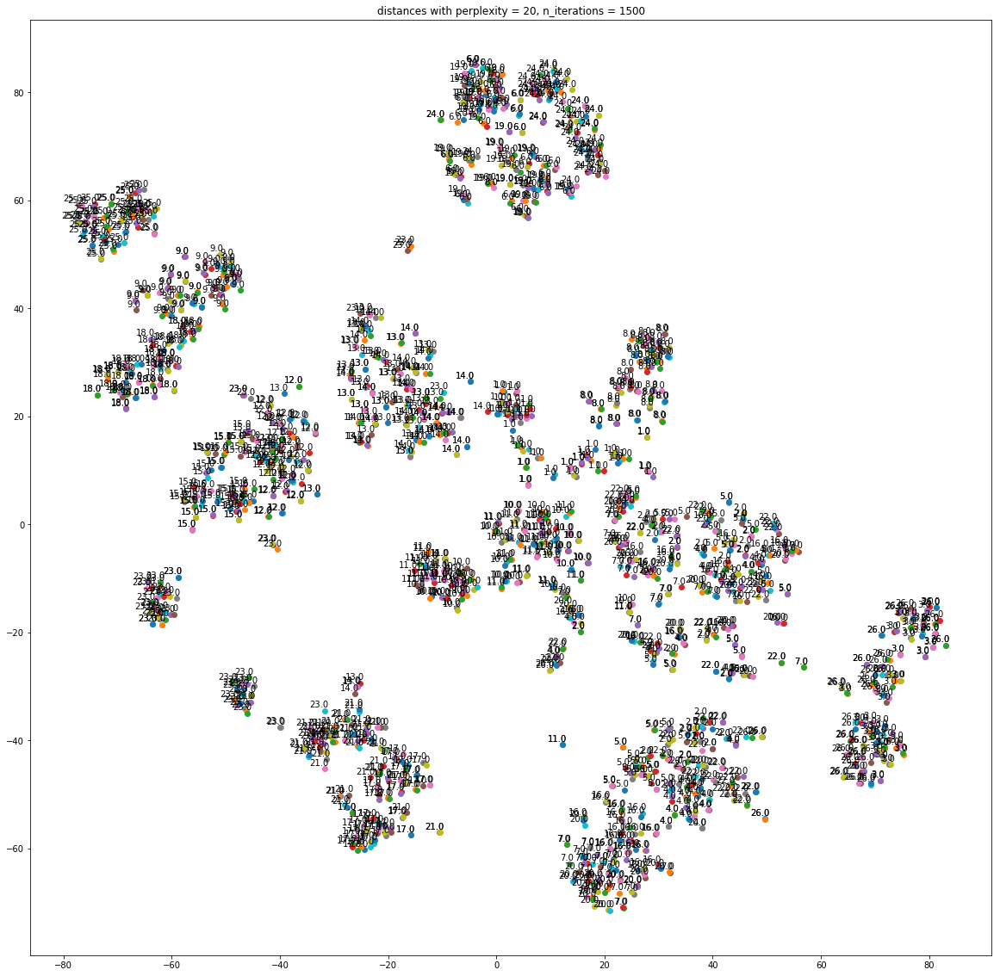

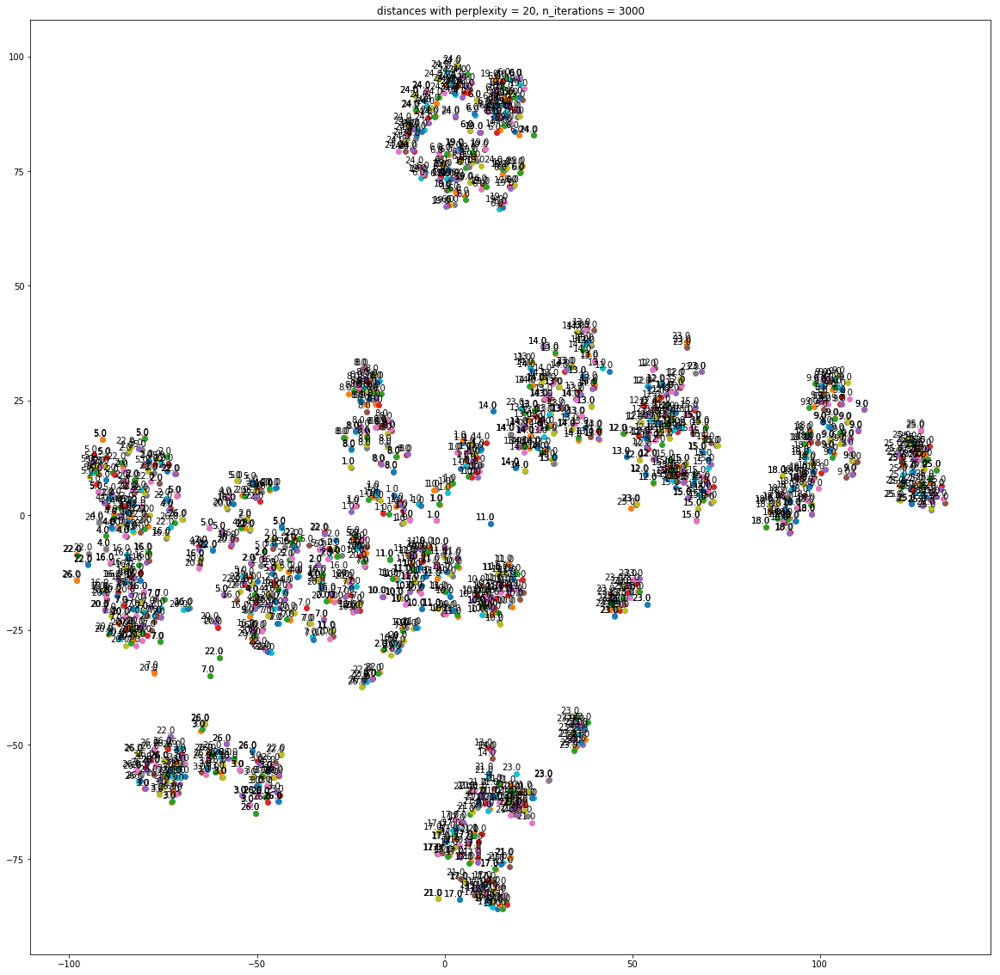

...

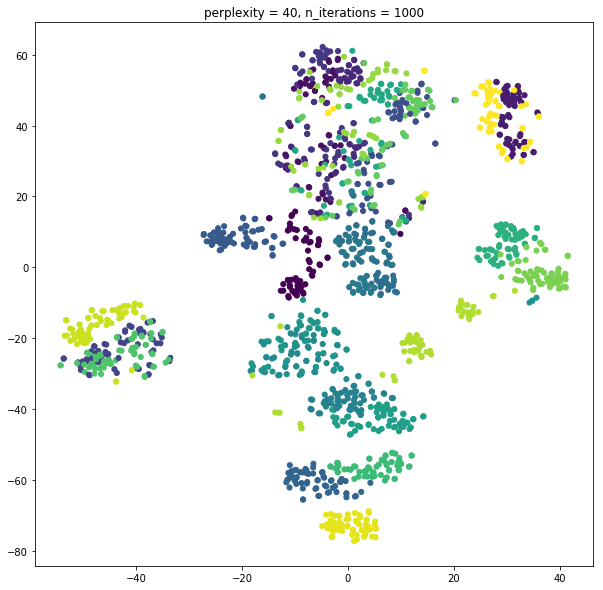

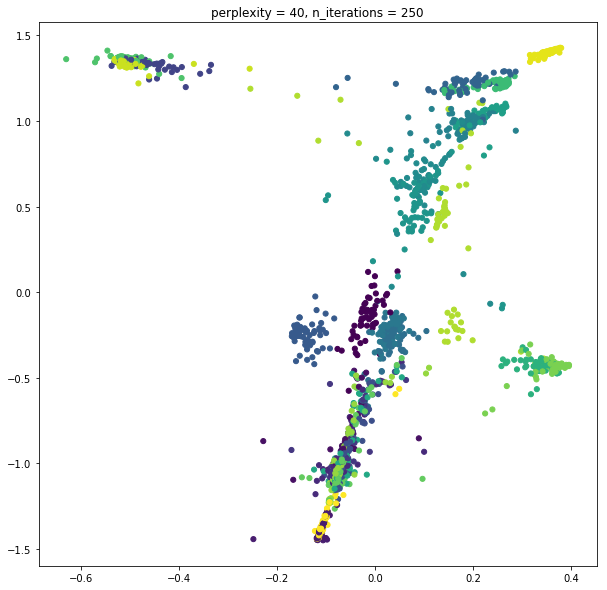

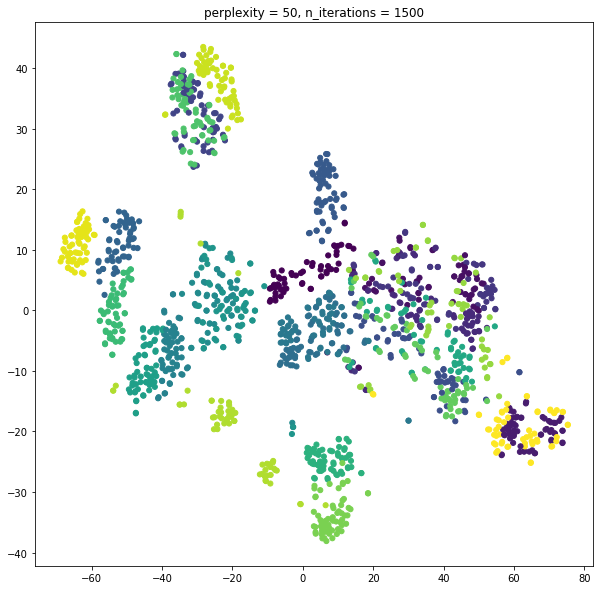

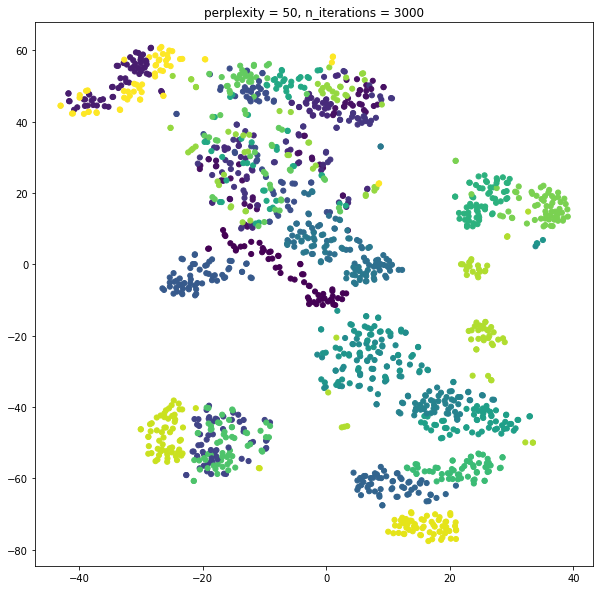

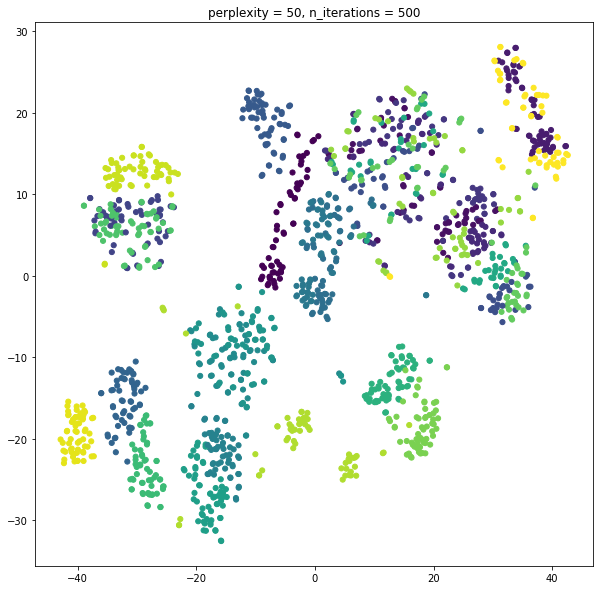

In [71]:
def tsne(X, Y,initial_dims=2, max_iter=2000, perplexity=30.0, verbose = True):
    #pca = PCA(n_components=initial_dims)
    #X_reduced = pca.fit_transform(X)
    tsne = TSNE(n_components=2, verbose=verbose, perplexity=perplexity, n_iter=max_iter)
    X_embedded = tsne.fit_transform(X)
    
    plot_with_labels(X_embedded, Y,title = "distances with perplexity = {0}, n_iterations = {1}".format(perplexity,n_iters))
    #plt.title("")
    plt.plot()
    return X_embedded
perplexities = [20,30,40,50,60]
n_iter = [250,500,1000,1500,3000]

#plt.figure(figsize = (15,15))
results = {}
start = time.time()
for perplexity in perplexities:
    for n_iters in n_iter:
        X_embedded = tsne(X,Y,initial_dims = 2, max_iter = n_iters, perplexity = perplexity,verbose = False)
        #plt.scatter(X_embedded[:,0],X_embedded[:,1],26,Y)
        results[(perplexity,n_iters)] = X_embedded

for i,j in results.keys():
    plt.figure(figsize = (10,10))
    
    plt.title("perplexity = {0}, n_iterations = {1}".format(i,j))
    t = results[(i,j)]
    plt.scatter(t[:,0],t[:,1],26,y)
end = time.time()
print("Time taken:{}".format(end-start))

In [72]:
print(end-start)
print(results.keys())

1088.3097605705261
dict_keys([(20, 250), (60, 1500), (20, 3000), (20, 1500), (60, 500), (20, 1000), (50, 250), (30, 250), (60, 250), (50, 1000), (40, 500), (30, 3000), (60, 3000), (60, 1000), (40, 3000), (30, 500), (20, 500), (30, 1000), (40, 1500), (30, 1500), (40, 1000), (40, 250), (50, 1500), (50, 3000), (50, 500)])


In [74]:
len(results)

25

In [76]:
results.keys()

dict_keys([(20, 250), (60, 1500), (20, 3000), (20, 1500), (60, 500), (20, 1000), (50, 250), (30, 250), (60, 250), (50, 1000), (40, 500), (30, 3000), (60, 3000), (60, 1000), (40, 3000), (30, 500), (20, 500), (30, 1000), (40, 1500), (30, 1500), (40, 1000), (40, 250), (50, 1500), (50, 3000), (50, 500)])

In [100]:
from sklearn.neighbors import NearestNeighbors as knn


def roc_metrics(nbrs_input, nbrs_output, input_k=50):
    n = nbrs_input.shape[0]

    tp_list = []
    fp_list = []

    for k in range(1, 100):
        tp_rate = 0
        fp_rate = 0
        for i in range(n):
            n_tp = np.intersect1d(nbrs_input[i], nbrs_output[i][:k]).shape[0]
            tp_rate += n_tp / input_k
            fp_rate += (k - n_tp) / (n - input_k)
        tp_list.append(tp_rate / n)
        fp_list.append(fp_rate / n)
        
    return tp_list, fp_list

def mean_precision_recall(nbrs_input, nbrs_output, input_k=50):
    n = nbrs_input.shape[0]
    
    recall_list = []
    precision_list = []

    for k in range(1,input_k+1):#1, 100):
        recall = 0
        precision = 0
        for i in range(n):
            n_tp = np.intersect1d(nbrs_input[i], nbrs_output[i][:k]).shape[0]
            recall += n_tp / input_k
            precision += n_tp / k
        recall_list.append(recall / n)
        precision_list.append(precision / n)
        
    return recall_list, precision_list

In [85]:
def drawProgressBar(percent, barLen = 50):
	sys.stdout.write("\r")
	progress = ""
	for i in range(barLen):
		if i<int(barLen * percent):
			progress += "="
		else:
			progress += " "
	sys.stdout.write("[ %s ] %.2f%%" % (progress, percent * 100))
	sys.stdout.flush()

[ ==========================================         ] 84.00%

/home/sanjay/.local/lib/python3.5/site-packages/matplotlib/pyplot.py:523: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


[ ================================================   ] 96.00%

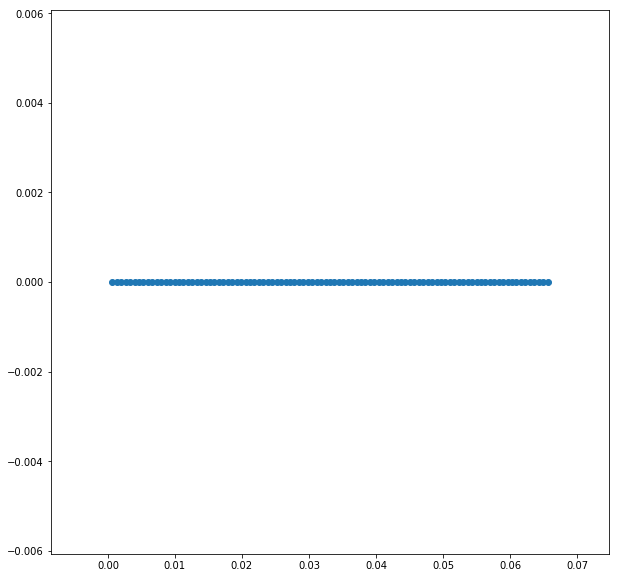

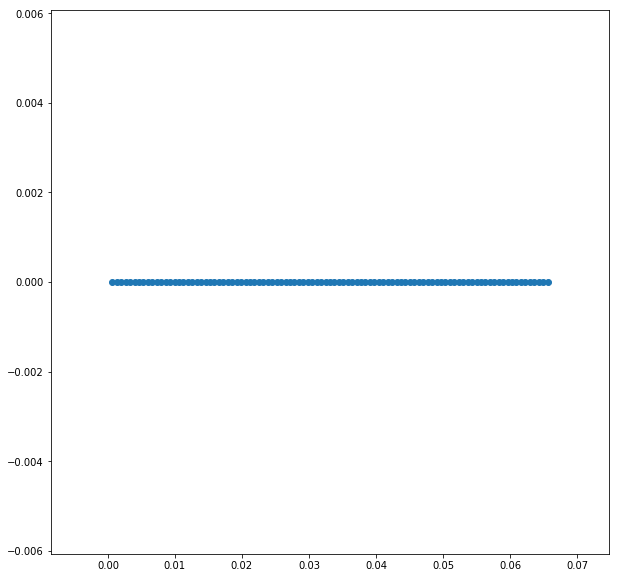

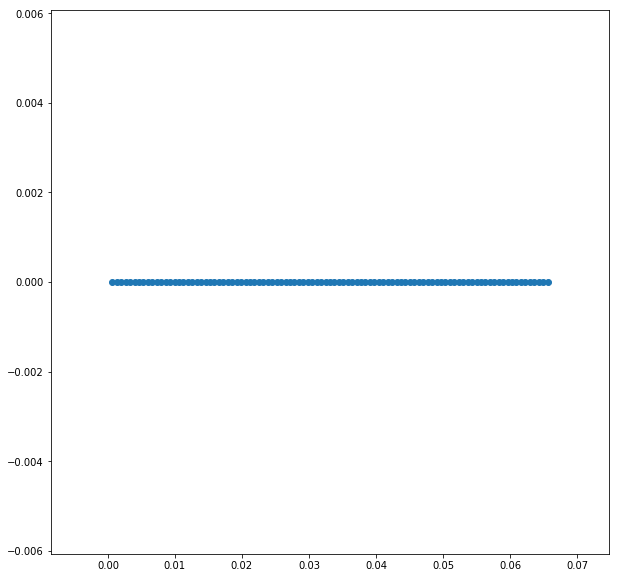

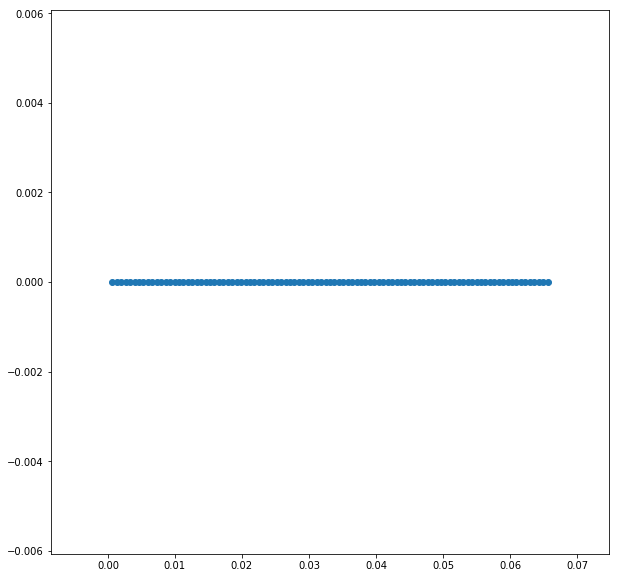

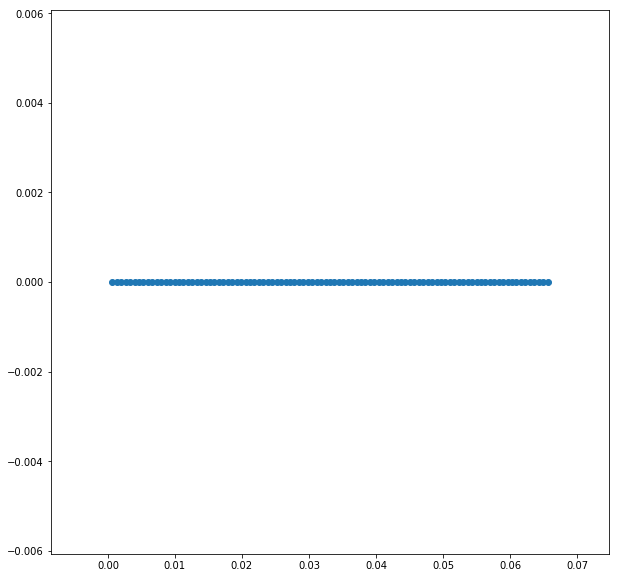

...

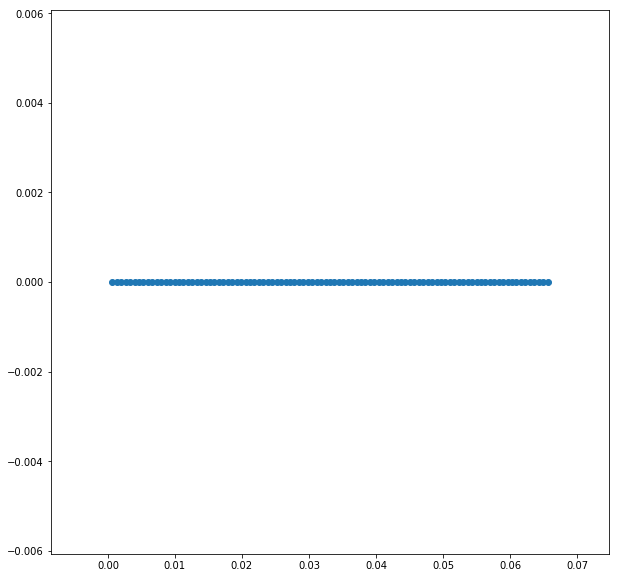

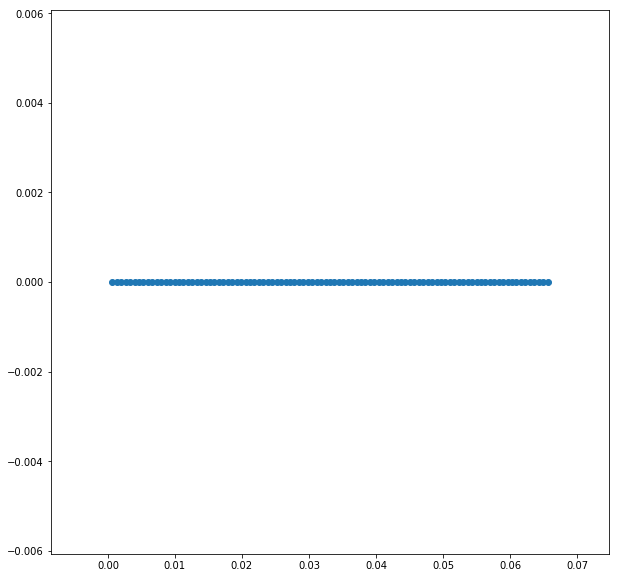

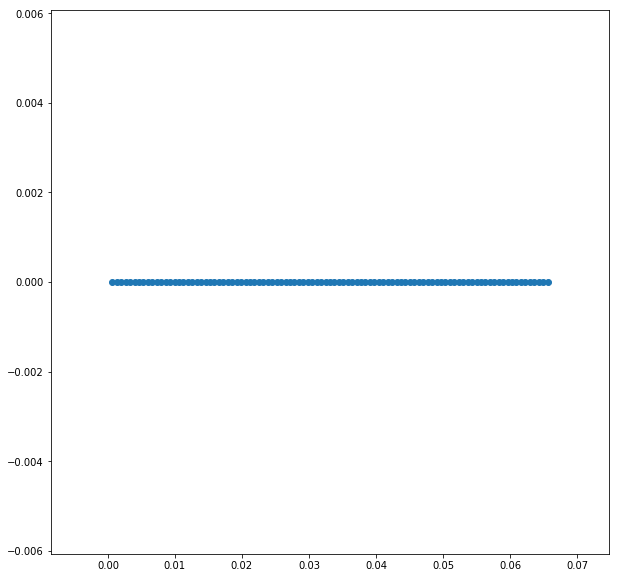

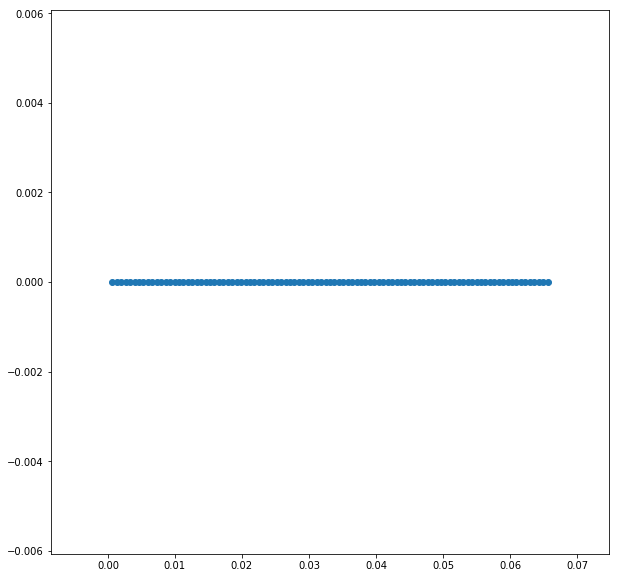

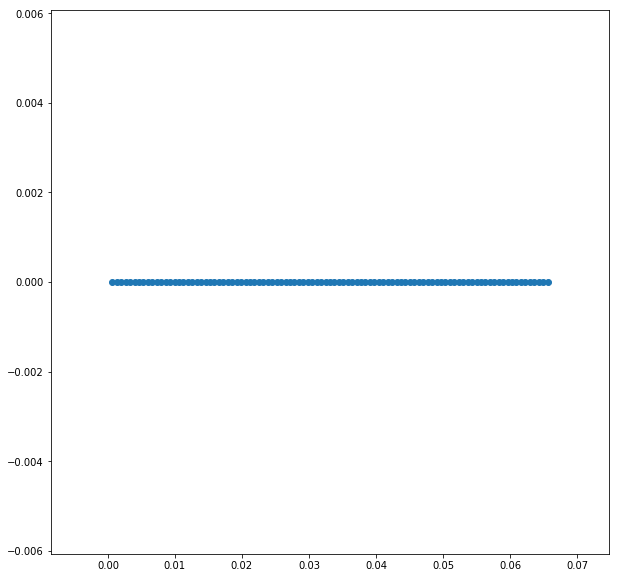

In [94]:
counter = 0
for i,j in results.keys():
    x_ = results[i,j]
    drawProgressBar(counter/len(results))
    #print(x_[:,0].shape)
    a,b = roc_metrics(X,x_)
    plt.figure(figsize=(10,10))
    plt.scatter(b,a)#,26)
    counter += 1
#    print(results[i,j].shape)

In [101]:
x,y = mean_precision_recall(x_,X, input_k=50)
#plt.plot(x,y)

In [102]:
x

[0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0]